In [1]:
# primary imports

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline  
%load_ext autoreload


### Calibration

In [2]:
import glob

class Calibrator: 

    objpoints = []

    imgpoints = []
    
    def __init__(self,imgs, nx, ny):
        objp = np.zeros((ny*nx,3),np.float32)
        objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
        
        for img in imgs:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
            
            if ret == True:
                self.imgpoints.append(corners)
                self.objpoints.append(objp)
                
    def undistort(self,img):  
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(self.objpoints, self.imgpoints, gray.shape[::-1], None, None)
        dst = cv2.undistort(img, mtx, dist, None, mtx)
        return dst

calibration_images = []
for file in glob.glob("camera_cal/calibration*.jpg"):
    img = mpimg.imread(file)
    calibration_images.append(img)

calibrator = Calibrator(calibration_images,9,6)

test_images = []
for file in glob.glob("test_images/*.jpg"):
    img = mpimg.imread(file)
    test_images.append(img)

calibrated_images = []
for img in test_images:
    calibrated = calibrator.undistort(img)
    calibrated_images.append(calibrated)

print("calibrated test images")


calibrated test images


#### Calibration - visualisation

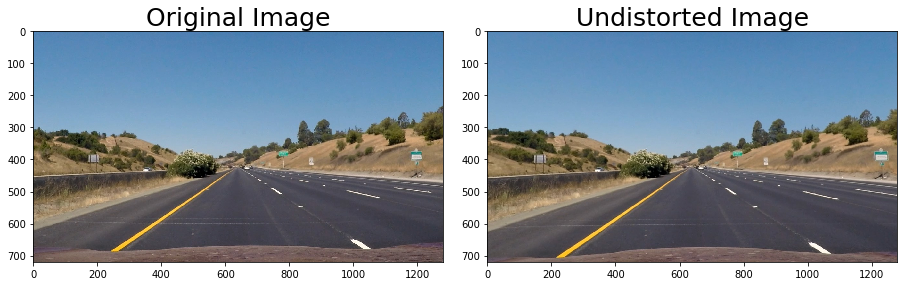

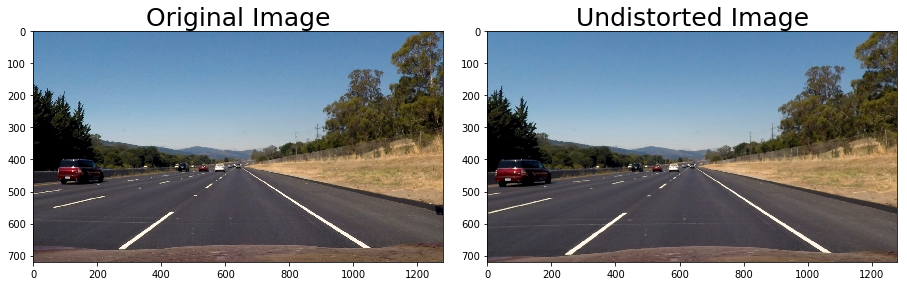

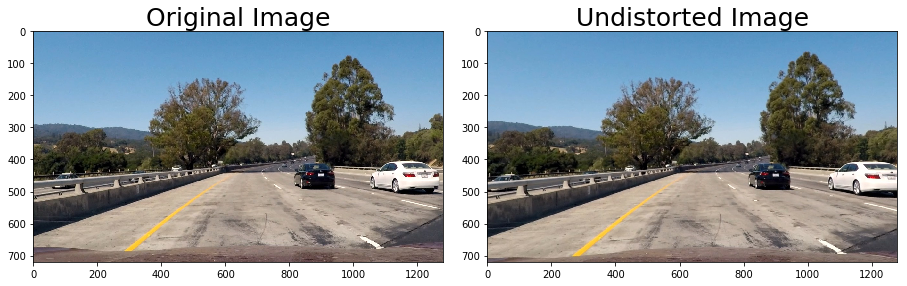

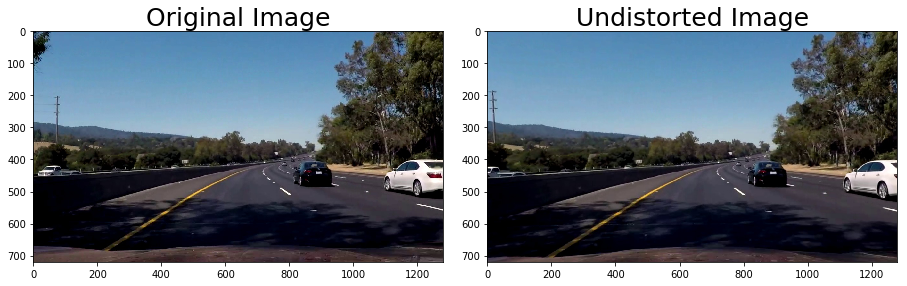

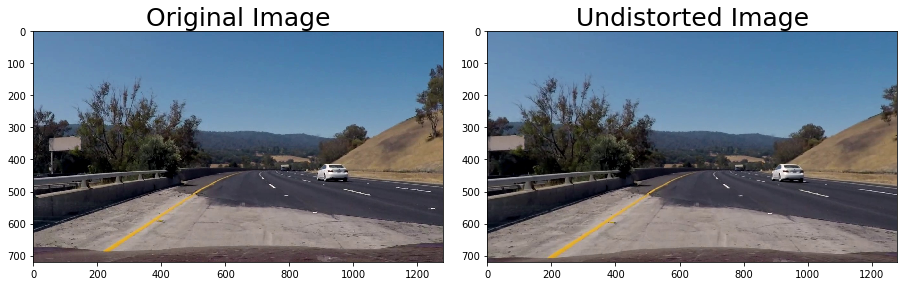

...

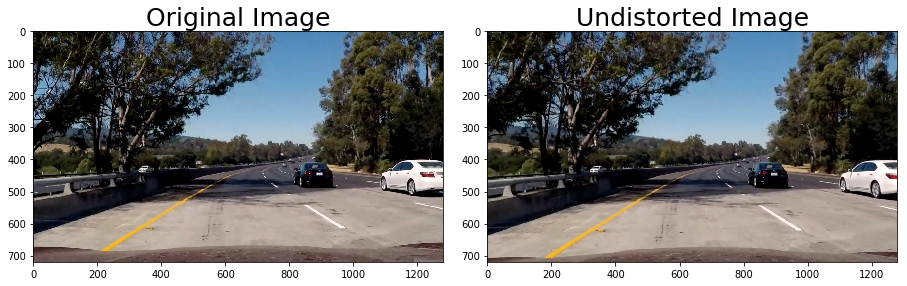

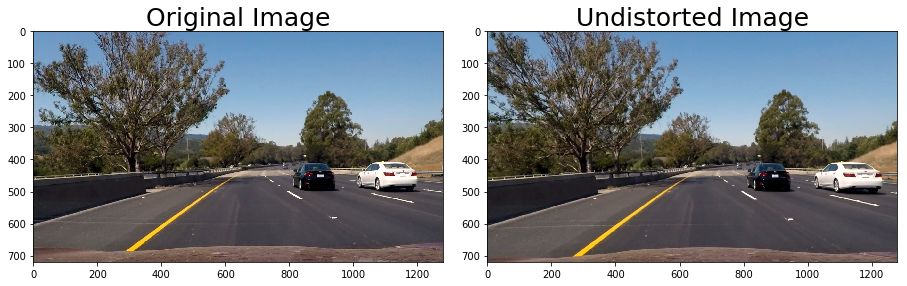

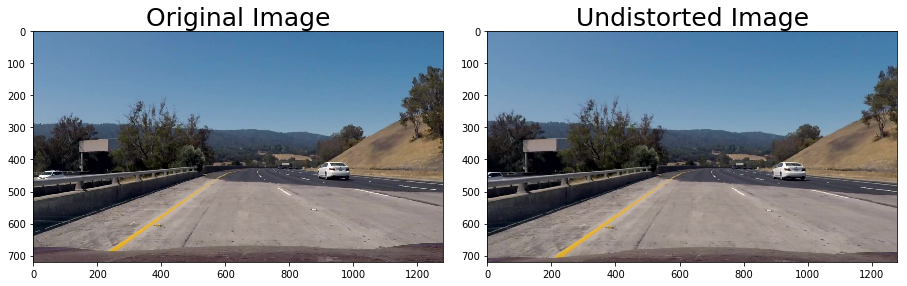

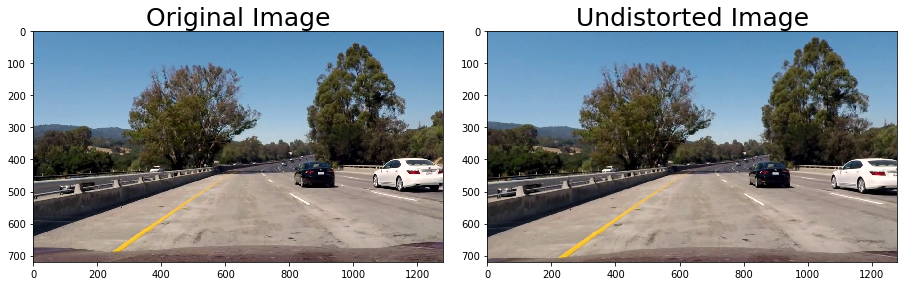

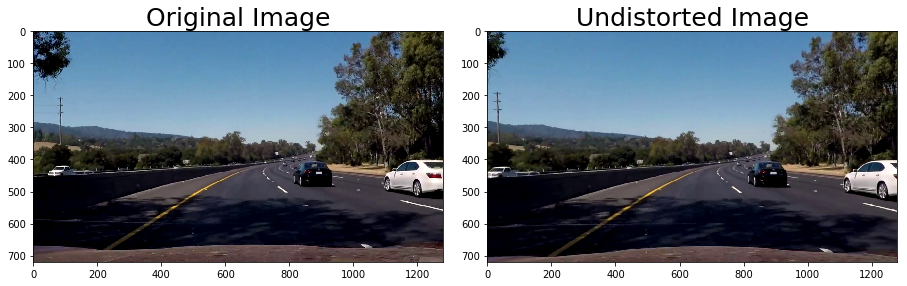

In [3]:
for i in range(len(calibrated_images)):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    f.tight_layout()
    ax1.imshow(test_images[i])
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(calibrated_images[i])
    ax2.set_title('Undistorted Image', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Transformation

In [4]:
class Transformer:   

    trap = np.array([[250,670],[(1280/2)-50,450],[(1280/2)+50,450],[1280-250,670]],dtype=np.int32)
    dst = np.array([[300,720],[300,0],[1280-300,0],[1280-300,720]],dtype=np.int32)              
               
    def transform(self,img):
        src = np.float32(self.trap)
        dst = np.float32(self.dst)
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
        return warped
    
    def inverse_transform(self,img):
        src = np.float32(self.trap)
        dst = np.float32(self.dst)
        M = cv2.getPerspectiveTransform(dst, src)
        warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
        return warped

transformer = Transformer()

transformed_images = []
for img in calibrated_images:
    transformed = transformer.transform(img)
    transformed_images.append(transformed)



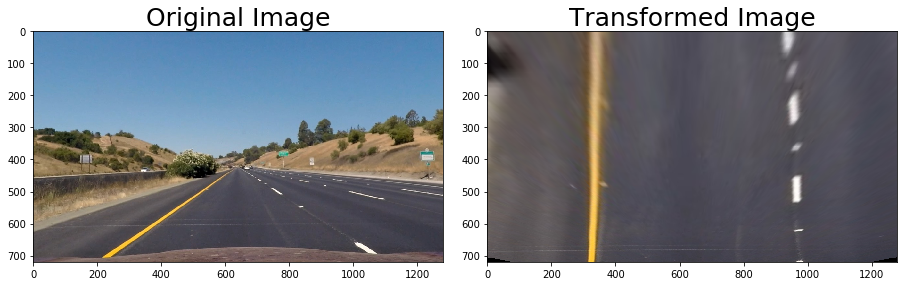

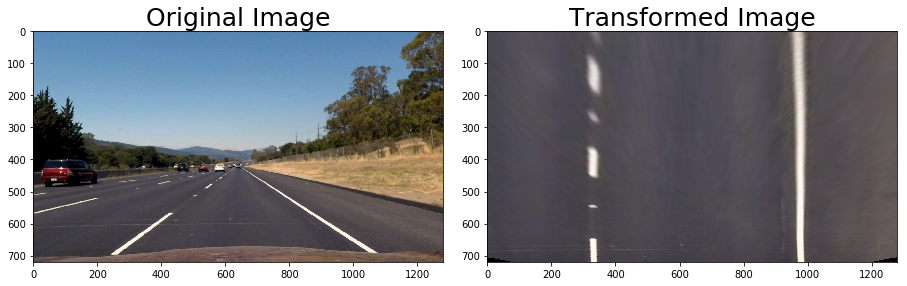

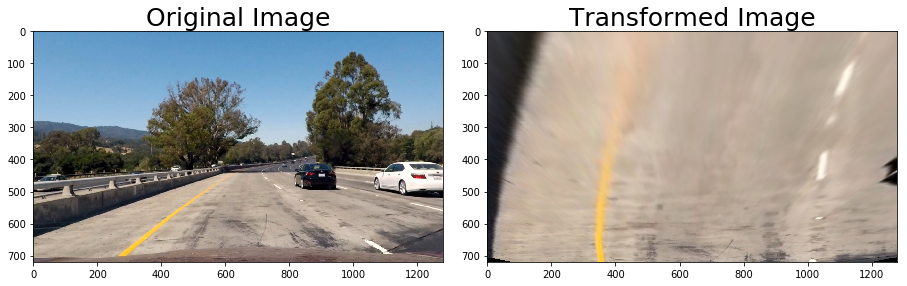

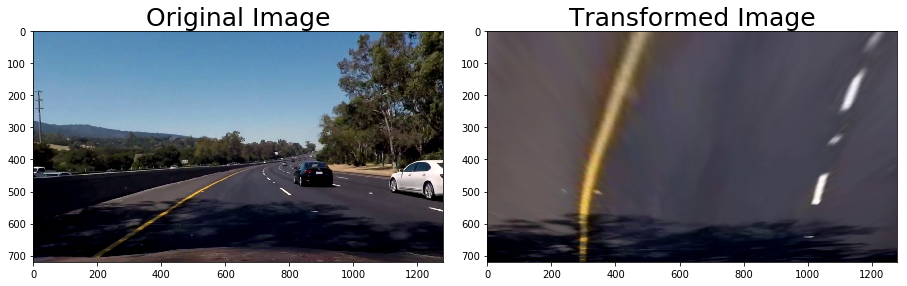

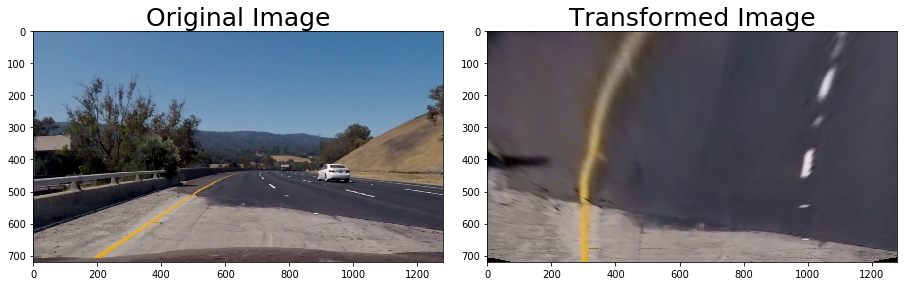

...

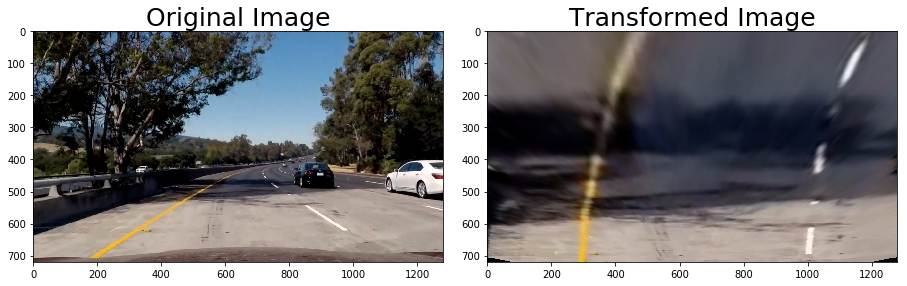

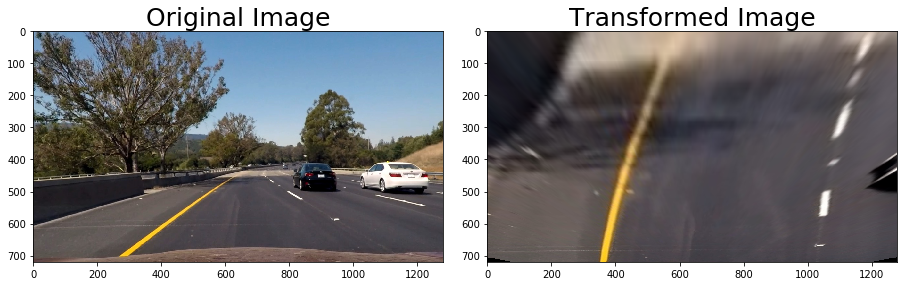

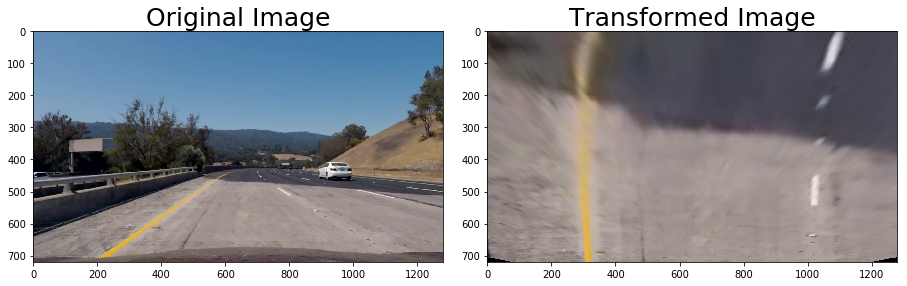

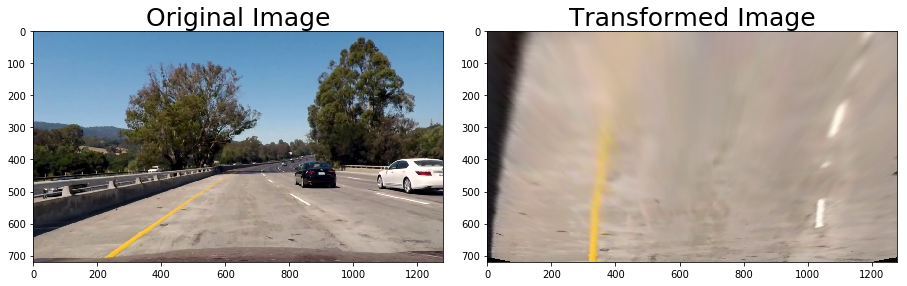

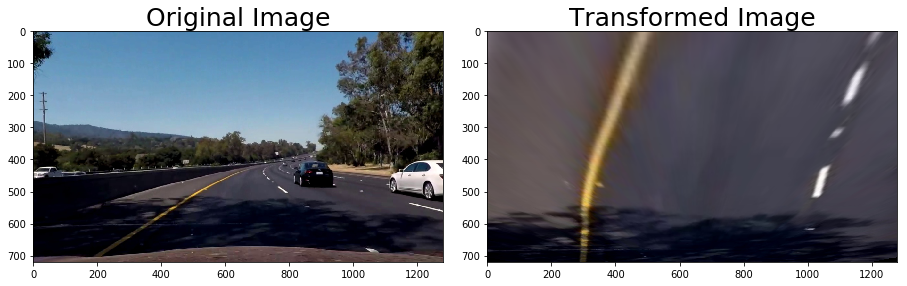

In [5]:
for i in range(len(calibrated_images)):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    f.tight_layout()
    ax1.imshow(calibrated_images[i])
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(transformed_images[i])
    ax2.set_title('Transformed Image', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Thresholding

In [6]:
def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # Return the binary image
    return binary_output

def yellow_filter(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # define range of yellow color in HSV
    lower_yellow = np.array([0,60,60])
    upper_yellow = np.array([50,255,255])  
    mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    return mask

def white_filter(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    # define range of white color in HSV
    lower_white = np.array([0,0,255-40])
    upper_white = np.array([255,40,255])
    mask = cv2.inRange(hsv, lower_white, upper_white)
    return mask

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def s_bin(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    thresh = (90, 200)
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary

def lane_mask(img):
    mag = mag_threshold(img, sobel_kernel=3, mag_thresh=(1, 255))
    yellow = yellow_filter(img)
    dir_t = dir_threshold(img, sobel_kernel=15, thresh=(-0.8,0.8)) 
    white = white_filter(img)
    yellow_and_white = np.zeros_like(mag)
    yellow_and_white[(yellow > 0) | (white > 0)] = 1
    yellow_and_white_mag = np.zeros_like(mag)
    yellow_and_white_mag[(yellow_and_white > 0) & mag > 0] = 1
    binary = np.zeros_like(mag)
    binary[(dir_t > 0) & (yellow_and_white_mag > 0)] = 1
    return binary

def line_equations(img):
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)    
    right_lane_inds = np.concatenate(right_lane_inds)
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit

masked_images = []
for img in transformed_images:
    binary = lane_mask(img)
    masked_images.append(binary)


#### Thresholding - visualisation

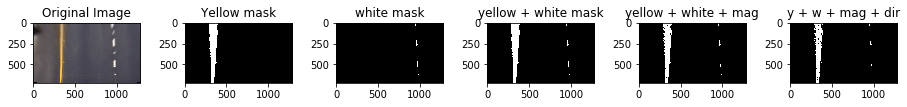

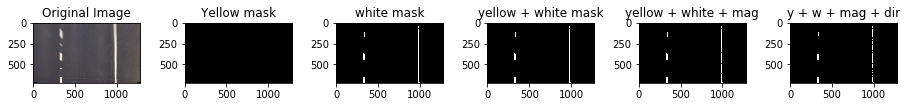

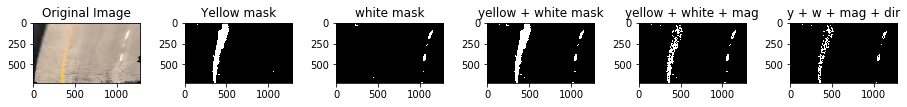

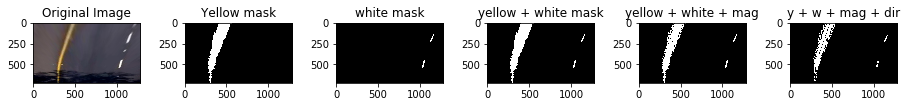

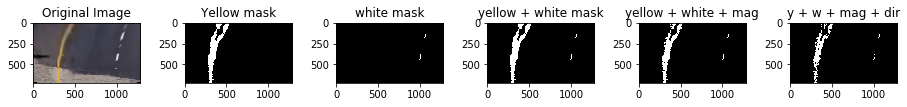

...

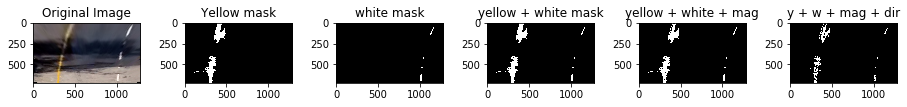

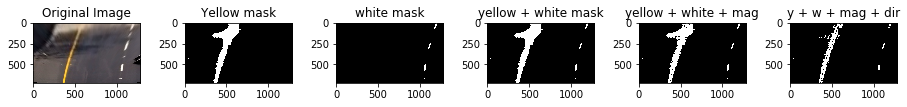

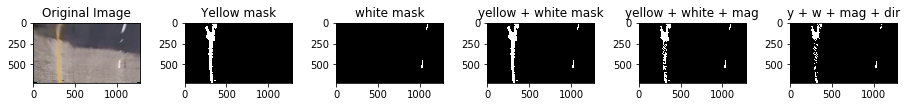

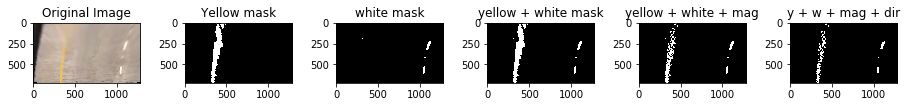

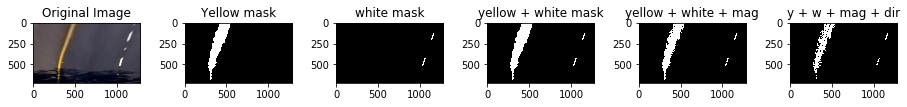

In [7]:
for i in range(len(calibrated_images)):
    
    img = transformed_images[i]
    
    mag = mag_threshold(img, sobel_kernel=3, mag_thresh=(1, 255))
    yellow = yellow_filter(img)
    dir_t = dir_threshold(img, sobel_kernel=15, thresh=(-0.8,0.8)) 
    white = white_filter(img)
    
    yellow_and_white = np.zeros_like(mag)
    yellow_and_white[(yellow > 0) | (white > 0)] = 1
    
    yellow_and_white_mag = np.zeros_like(mag)
    yellow_and_white_mag[(yellow_and_white > 0) & mag > 0] = 1
    
    binary = np.zeros_like(mag)
    binary[(dir_t > 0) & (yellow_and_white_mag > 0)] = 1

    f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(12, 5))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image')
    ax2.imshow(yellow, cmap = "gray")
    ax2.set_title('Yellow mask')
    ax3.imshow(white, cmap = "gray")
    ax3.set_title('white mask')
    ax4.imshow(yellow_and_white, cmap = "gray")
    ax4.set_title('yellow + white mask')
    ax5.imshow(yellow_and_white_mag, cmap = "gray")
    ax5.set_title('yellow + white + mag')
    ax6.imshow(masked_images[i], cmap = "gray")
    ax6.set_title('y + w + mag + dir')


    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Lane Finding

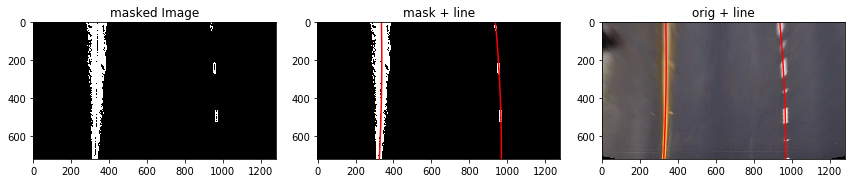

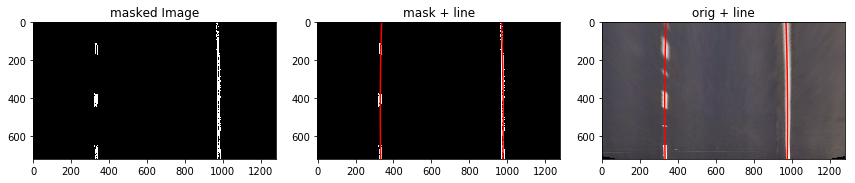

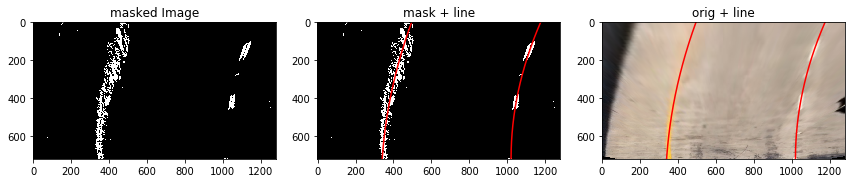

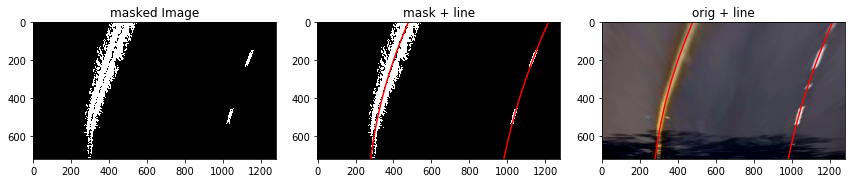

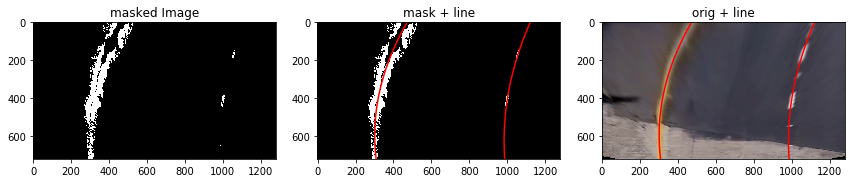

...

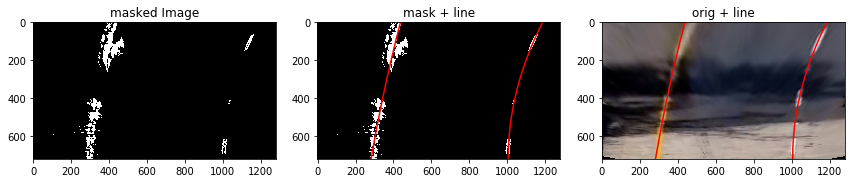

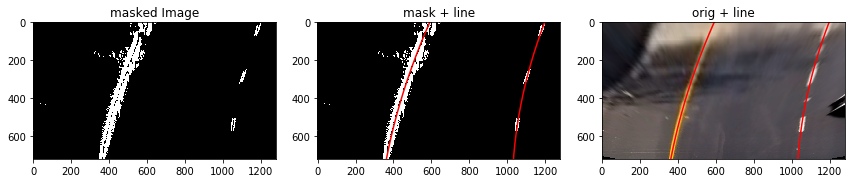

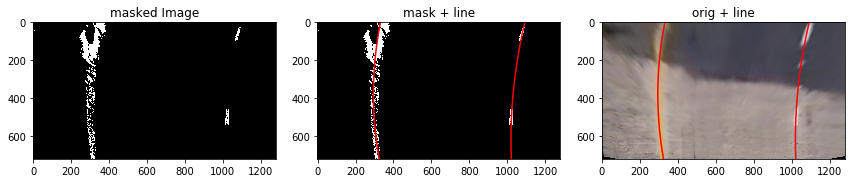

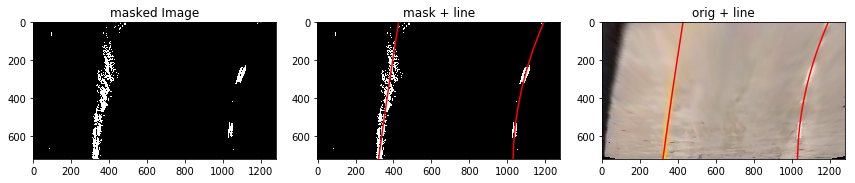

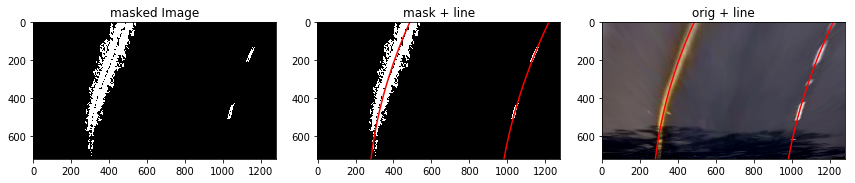

In [8]:
for i in range(len(masked_images)):
    masked = masked_images[i]
    orig = transformed_images[i]
    left_fit, right_fit = line_equations(masked)

    ploty = np.linspace(0, masked.shape[0]-1, masked.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(masked).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
    f.tight_layout()
    ax1.imshow(masked, cmap = 'gray')
    ax1.set_title('masked Image')
    
    
    ax2.imshow(masked, cmap="gray")
    ax2.plot(left_fitx, ploty, color='red')
    ax2.plot(right_fitx, ploty, color='red')
    ax2.set_title('mask + line')

    ax3.imshow(orig)
    ax3.set_title('orig + line')
    ax3.plot(left_fitx, ploty, color='red')
    ax3.plot(right_fitx, ploty, color='red')





### Lane Curvature

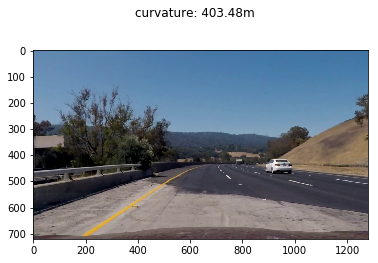

In [9]:
# as Taken from Udacity course material
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def curvature(left_fit,right_fit):
    ploty = np.linspace(0, 719,720)
    y_eval = np.max(ploty)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0]) 
    average = (left_curverad + right_curverad) / 2
    return average

def center_offset(left_fit,right_fit,img_size):
    ploty = np.linspace(0, img_size[0]-1, img_size[0])
    y_eval = np.max(ploty)
    overlay = np.zeros((img_size)).astype(np.uint8)
    overlay = np.dstack((overlay, overlay, overlay))
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    from_center = (left_fitx[-1]+right_fitx[-1] -1280)*xm_per_pix/2
    return from_center

img = calibrated_images[4]
masked = masked_images[4]
left_fit, right_fit = line_equations(masked)
curvature_in_m = curvature(left_fit,right_fit)
plt.suptitle('curvature: {0:.2f}m'.format(curvature_in_m))
plt.imshow(img)


### Center offset

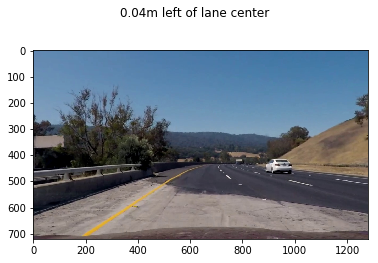

In [10]:
img = calibrated_images[4]
masked = masked_images[4]
left_fit, right_fit = line_equations(masked)
offset = center_offset(left_fit,right_fit, masked.shape)
plt.suptitle('{0:.2f}m left of lane center'.format(offset))
plt.imshow(img)


### Lane overlay

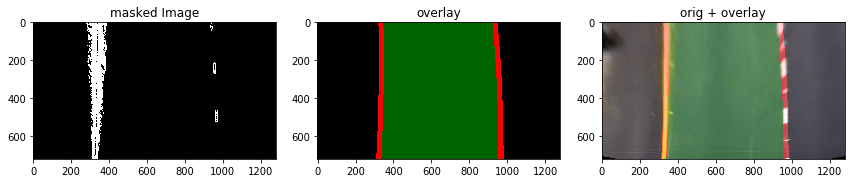

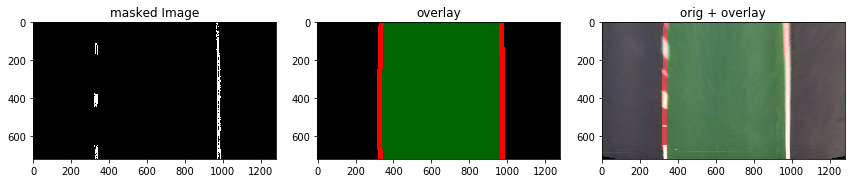

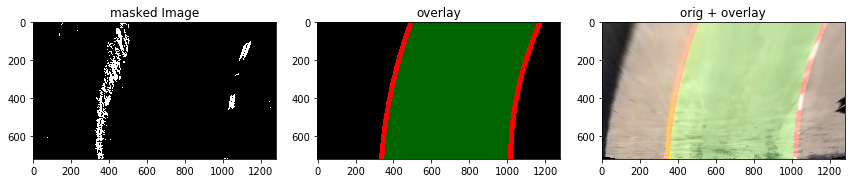

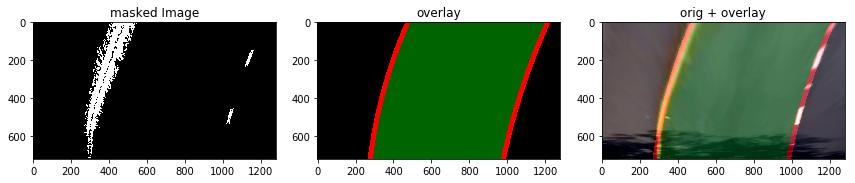

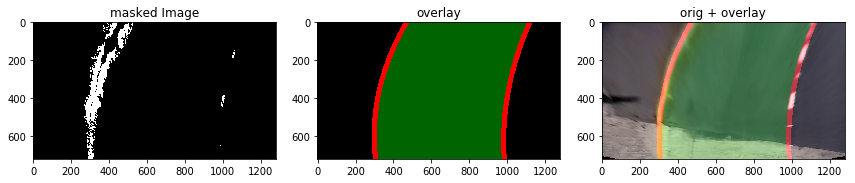

...

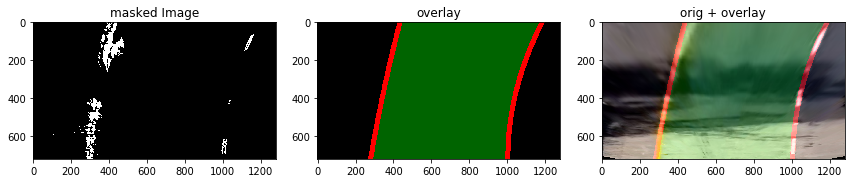

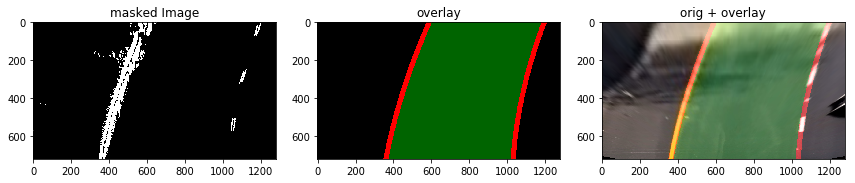

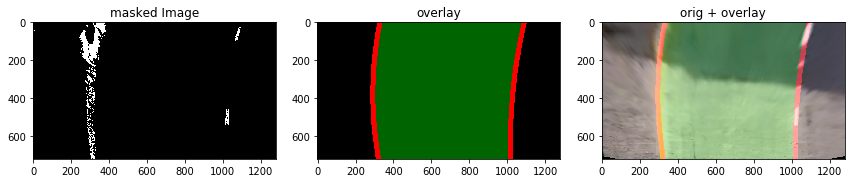

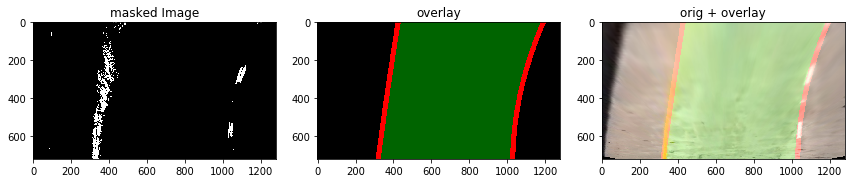

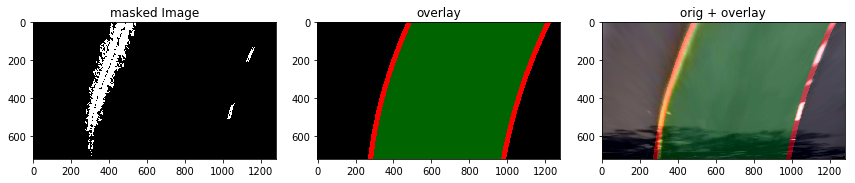

In [11]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def lane_measurements_overlay(left_fit,right_fit,img_size):
    overlay = np.zeros((img_size)).astype(np.uint8)
    overlay = np.dstack((overlay, overlay, overlay))
    curvature_result = curvature(left_fit,right_fit)
    font = cv2.FONT_HERSHEY_SIMPLEX 
    cv2.putText(overlay, "lane curvature radius:", (30, 60), font, 1, (255,255,255), 2,cv2.LINE_AA)
    cv2.putText(overlay, "{0:.2f}m".format(curvature_result), (30, 100), font, 1, (255,255,255), 2,cv2.LINE_AA)
    from_center = center_offset(left_fit,right_fit,img_size)  
    cv2.putText(overlay, "center offset:", (30, 200), font, 1, (255,255,255), 2,cv2.LINE_AA)
    center_offset_string = "{0:.2f}m left of center".format(from_center)
    cv2.putText(overlay, center_offset_string ,(30,240), font, 1, (255,255,255),2,cv2.LINE_AA)
    return overlay

def lane_overlay(left_fit,right_fit,img_size,c1=[100,0,0],c2=[0,100,0],c3=[0,0,100]):
    ploty = np.linspace(0, img_size[0]-1, img_size[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Create an image to draw the lines on
    overlay = np.zeros((img_size)).astype(np.uint8)
    overlay = np.dstack((overlay, overlay, overlay))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    r_line_pts = pts_right.reshape((-1,1,2))
    l_line_pts = pts_left.reshape((-1,1,2))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(overlay, np.int_([pts]), (0,100, 0))
    cv2.polylines(overlay,np.int_([r_line_pts]),False,(255,0,0), 25)
    cv2.polylines(overlay,np.int_([l_line_pts]),False,(255,0,0), 25)
    return overlay

for i in range(len(masked_images)):
    masked = masked_images[i]
    orig = transformed_images[i]
    left_fit, right_fit = line_equations(masked)
    frame_driving_info = lane_overlay(left_fit, right_fit,masked.shape)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
    f.tight_layout()
    ax1.imshow(masked, cmap = 'gray')
    ax1.set_title('masked Image')
    
    ax2.imshow(frame_driving_info)
    ax2.set_title('overlay')
    
    both = cv2.addWeighted(orig, 1, frame_driving_info, 0.5, 0)

    ax3.imshow(both)
    ax3.set_title('orig + overlay')




        

### Inverse transformation

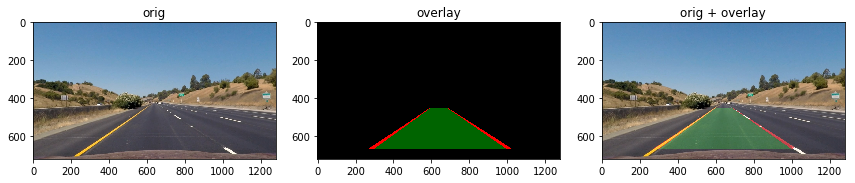

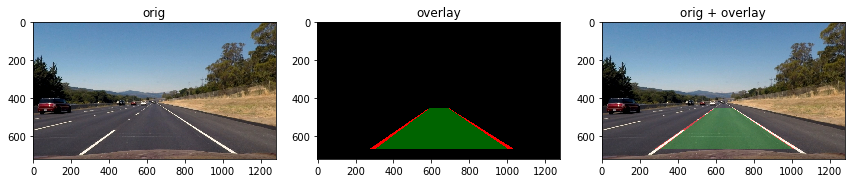

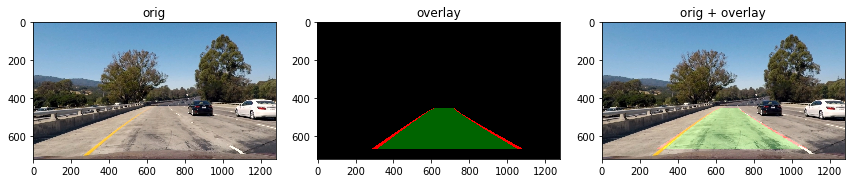

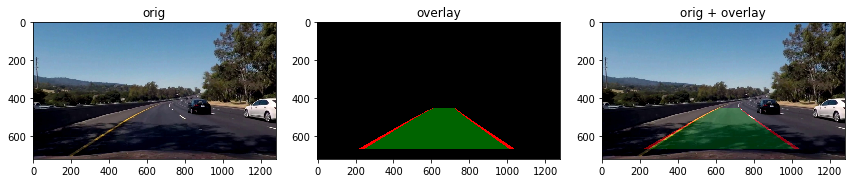

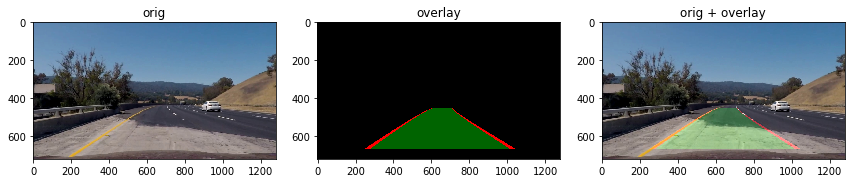

...

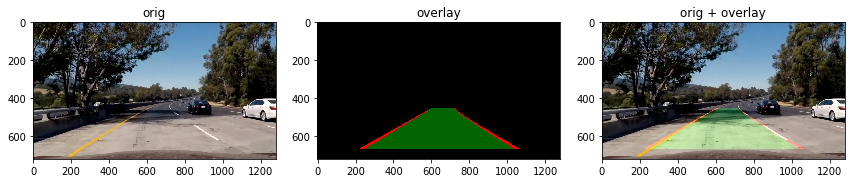

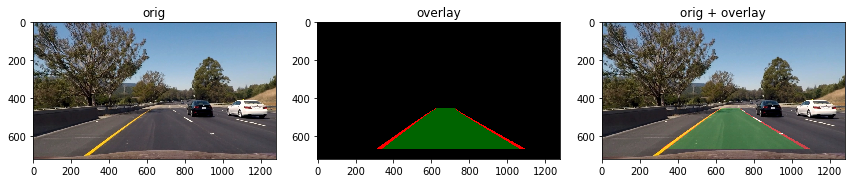

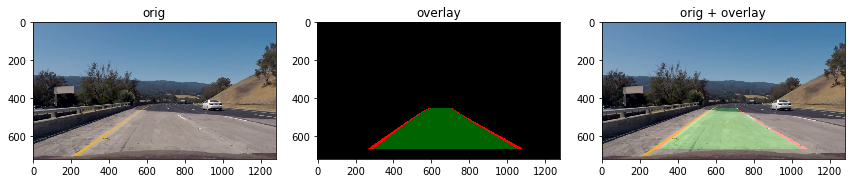

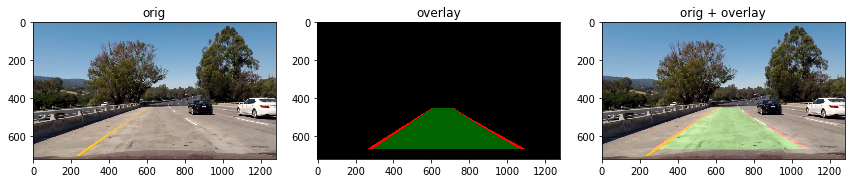

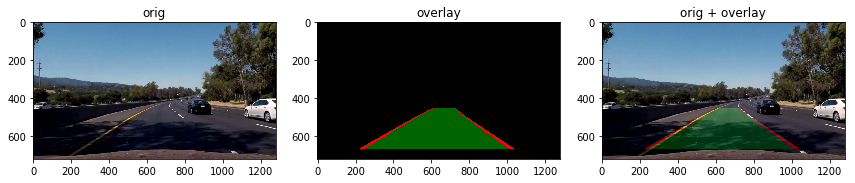

In [12]:
for i in range(len(masked_images)):
    masked = masked_images[i]
    orig = calibrated_images[i]
    left_fit, right_fit = line_equations(masked)
    frame_info = lane_overlay(left_fit, right_fit,masked.shape)
    frame_info = transformer.inverse_transform(frame_info)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
    f.tight_layout()
    ax1.imshow(orig, cmap = 'gray')
    ax1.set_title('orig')
    
    ax2.imshow(frame_info)
    ax2.set_title('overlay')
    
    both = cv2.addWeighted(orig, 1, frame_info, 0.5, 0)

    ax3.imshow(both)
    ax3.set_title('orig + overlay')




### Image pipeline

In [13]:
def process_image(img):
    undist = calibrator.undistort(img)
    transformed = transformer.transform(undist)
    masked = lane_mask(transformed)
    left_fit, right_fit = line_equations(masked)
    lane_overlay_result = lane_overlay(left_fit, right_fit,masked.shape)
    overlay_undist = transformer.inverse_transform(lane_overlay_result)
    frame_info = lane_measurements_overlay(left_fit, right_fit,masked.shape)
    final = cv2.addWeighted(undist, 1, overlay_undist, 0.5, 0)
    final = cv2.addWeighted(final, 1, frame_info, 0.9, 0)

    return final


### Video creation

In [18]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def find_lanes_in_video(clip_path):
    from moviepy.editor import VideoFileClip
    clip = VideoFileClip(clip_path)
    filename = clip_path.split('/')[-1]#take filename
    output_video = "output_video/"+filename
    output_clip = clip.fl_image(process_image)
    output_clip.write_videofile(output_video, audio=False, fps=25)

In [19]:
find_lanes_in_video('project_video.mp4')

[MoviePy] >>>> Building video output_video/project_video.mp4
[MoviePy] Writing video output_video/project_video.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [15:51<00:00,  1.33it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video/project_video.mp4 



In [23]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('output_video/project_video.mp4'))